In [1]:
!nvidia-smi


Fri Sep 19 11:49:15 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   65C    P8             12W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
#clone YOLO v5 repository
!git clone https://github.com/ultralytics/yolov5.git
%cd yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 17581, done.
remote: Counting objects: 100% (63/63), done.
remote: Compressing objects: 100% (54/54), done.
remote: Total 17581 (delta 39), reused 9 (delta 9), pack-reused 17518 (from 4)
Receiving objects: 100% (17581/17581), 16.66 MiB | 9.26 MiB/s, done.
Resolving deltas: 100% (12043/12043), done.
/content/yolov5


In [3]:
# install dependencies as necessary
!pip install -qr requirements.txt
import torch

from IPython.display import Image, clear_output

print("setup complete, using torch %s %s" % (torch. __version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 40.9 MB/s eta 0:00:00
setup complete, using torch 2.8.0+cu126 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15095MB, multi_processor_count=40, uuid=7f7d3bd2-860a-4505-2d73-b89c9b1a4c9b, pci_bus_id=0, pci_device_id=4, pci_domain_id=0, L2_cache_size=4MB)


In [4]:
pwd


'/content/yolov5'

In [5]:
%cd /content


/content


In [6]:
import gdown

url= "https://drive.google.com/file/d/17x6Pu2UShYHVxt-w67Yz7uZm3xxqAaMW/view?usp=drive_link"
file_id = url.split("/")[-2]
print(file_id)
prefix = "https://drive.google.com/uc?/export=download&id="
gdown.download(prefix+file_id, "waste_detection.zip")
print("Data downloaded")

17x6Pu2UShYHVxt-w67Yz7uZm3xxqAaMW


Downloading...
From (original): https://drive.google.com/uc?/export=download&id=17x6Pu2UShYHVxt-w67Yz7uZm3xxqAaMW
From (redirected): https://drive.google.com/uc?%2Fexport=download&id=17x6Pu2UShYHVxt-w67Yz7uZm3xxqAaMW&confirm=t&uuid=69c4a4a0-5440-4645-90d6-a4810db5a851
To: /content/waste_detection.zip
100%|██████████| 180M/180M [00:05<00:00, 31.6MB/s]

Data downloaded


In [7]:
!unzip -o waste_detection.zip
# !rm -rf waste_detection.zip

Streaming output truncated to the last 5000 lines.
  inflating: GARBAGE CLASSIFICATION/train/labels/plastic1013_jpg.rf.302aa51298f9b562a2f341a70ddfcdda.txt  
  inflating: GARBAGE CLASSIFICATION/train/labels/plastic1015_jpg.rf.b1624aa91fbe1e966bc59b9e6d6d9869.txt  
  inflating: GARBAGE CLASSIFICATION/train/labels/plastic1016_jpg.rf.97f0944065a2996ae3de7efe5d9d5323.txt  
  inflating: GARBAGE CLASSIFICATION/train/labels/plastic1018_jpg.rf.1127bc64321e3586f399f1cb4aa44d33.txt  
  inflating: GARBAGE CLASSIFICATION/train/labels/plastic1019_jpg.rf.cd6baab15a8fc8c113122a3624de2672.txt  
  inflating: GARBAGE CLASSIFICATION/train/labels/plastic1021_jpg.rf.cc8873ffce8bdd8ccdf550312636bc3c.txt  
  inflating: GARBAGE CLASSIFICATION/train/labels/plastic1022_jpg.rf.7ab0defd116164a33ecb2542837252d9.txt  
  inflating: GARBAGE CLASSIFICATION/train/labels/plastic1023_jpg.rf.e7413da8aea1ac0a3bf15613112608df.txt  
  inflating: GARBAGE CLASSIFICATION/train/labels/plastic1025_jpg.rf.7ac20af8be2c2f48b05614942

In [8]:
%cat "GARBAGE CLASSIFICATION/data.yaml"

train: ../train/images
val: ../valid/images
test: ../test/images

nc: 6
names: ['BIODEGRADABLE', 'CARDBOARD', 'GLASS', 'METAL', 'PAPER', 'PLASTIC']

roboflow:
  workspace: material-identification
  project: garbage-classification-3
  version: 2
  license: CC BY 4.0
  url: https://universe.roboflow.com/material-identification/garbage-classification-3/dataset/2

In [9]:
import yaml
with open("GARBAGE CLASSIFICATION/data.yaml",'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [10]:
num_classes

'6'

In [11]:
%cat /content/yolov5/models/yolov5s.yaml

# Ultralytics 🚀 AGPL-3.0 License - https://ultralytics.com/license

# Parameters
nc: 80 # number of classes
depth_multiple: 0.33 # model depth multiple
width_multiple: 0.50 # layer channel multiple
anchors:
  - [10, 13, 16, 30, 33, 23] # P3/8
  - [30, 61, 62, 45, 59, 119] # P4/16
  - [116, 90, 156, 198, 373, 326] # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [
    [-1, 1, Conv, [64, 6, 2, 2]], # 0-P1/2
    [-1, 1, Conv, [128, 3, 2]], # 1-P2/4
    [-1, 3, C3, [128]],
    [-1, 1, Conv, [256, 3, 2]], # 3-P3/8
    [-1, 6, C3, [256]],
    [-1, 1, Conv, [512, 3, 2]], # 5-P4/16
    [-1, 9, C3, [512]],
    [-1, 1, Conv, [1024, 3, 2]], # 7-P5/32
    [-1, 3, C3, [1024]],
    [-1, 1, SPPF, [1024, 5]], # 9
  ]

# YOLOv5 v6.0 head
head: [
    [-1, 1, Conv, [512, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 6], 1, Concat, [1]], # cat backbone P4
    [-1, 3, C3, [512, False]], # 13

    [-1, 1, Conv, [256, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, 

In [12]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line,cell):
    with open(line,'w') as f:
        f.write(cell.format(**globals()))

In [13]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml


# Parameters
nc: {num_classes} # number of classes
depth_multiple: 0.33 # model depth multiple
width_multiple: 0.50 # layer channel multiple
anchors:
  - [10, 13, 16, 30, 33, 23] # P3/8
  - [30, 61, 62, 45, 59, 119] # P4/16
  - [116, 90, 156, 198, 373, 326] # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [
    [-1, 1, Conv, [64, 6, 2, 2]], # 0-P1/2
    [-1, 1, Conv, [128, 3, 2]], # 1-P2/4
    [-1, 3, C3, [128]],
    [-1, 1, Conv, [256, 3, 2]], # 3-P3/8
    [-1, 6, C3, [256]],
    [-1, 1, Conv, [512, 3, 2]], # 5-P4/16
    [-1, 9, C3, [512]],
    [-1, 1, Conv, [1024, 3, 2]], # 7-P5/32
    [-1, 3, C3, [1024]],
    [-1, 1, SPPF, [1024, 5]], # 9
  ]

# YOLOv5 v6.0 head
head: [
    [-1, 1, Conv, [512, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 6], 1, Concat, [1]], # cat backbone P4
    [-1, 3, C3, [512, False]], # 13

    [-1, 1, Conv, [256, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 4], 1, Concat, [1]], # cat backbone P3
    [-1, 3, C3, [256, False]], # 17 (P3/8-small)

    [-1, 1, Conv, [256, 3, 2]],
    [[-1, 14], 1, Concat, [1]], # cat head P4
    [-1, 3, C3, [512, False]], # 20 (P4/16-medium)

    [-1, 1, Conv, [512, 3, 2]],
    [[-1, 10], 1, Concat, [1]], # cat head P5
    [-1, 3, C3, [1024, False]], # 23 (P5/32-large)

    [[17, 20, 23], 1, Detect, [nc, anchors]], # Detect(P3, P4, P5)
  ]

In [14]:
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 50 --data '/content/GARBAGE CLASSIFICATION//data.yaml' --cfg ./models/custom_yolov5s.yaml --weights 'yolov5s.pt' --name yolov5s_results --cache

Streaming output truncated to the last 5000 lines.
  with torch.cuda.amp.autocast(amp):
      44/49      2.07G    0.04324    0.04814   0.005072        157        416:  59% 272/458 [00:46<00:31,  5.92it/s]/content/yolov5/train.py:414: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      44/49      2.07G    0.04325     0.0482   0.005072        237        416:  60% 273/458 [00:46<00:29,  6.31it/s]/content/yolov5/train.py:414: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      44/49      2.07G    0.04324    0.04815   0.005062        135        416:  60% 274/458 [00:46<00:28,  6.40it/s]/content/yolov5/train.py:414: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(

In [15]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

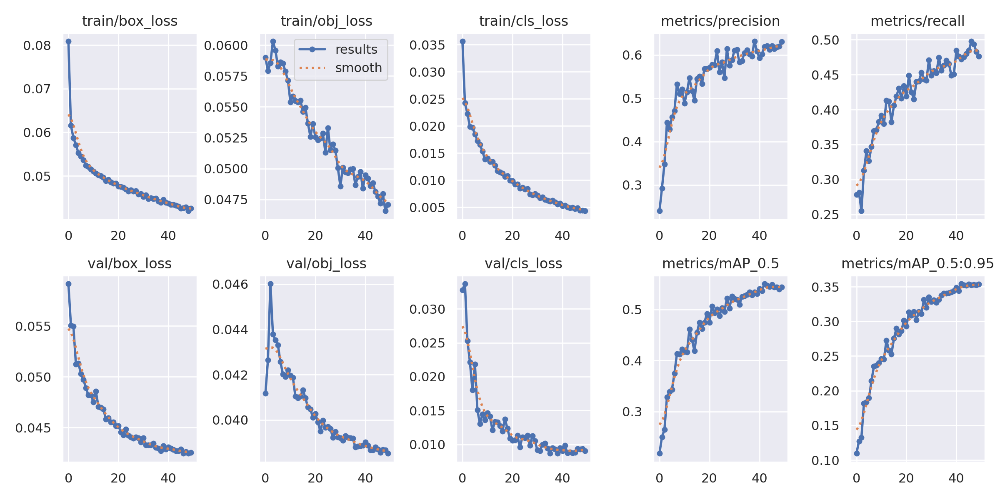

In [18]:
from utils.plots import plot_results
Image(filename= "/content/yolov5/runs/train/yolov5s_results/results.png", width=1000) # view results.png

Ground Truth Training data :


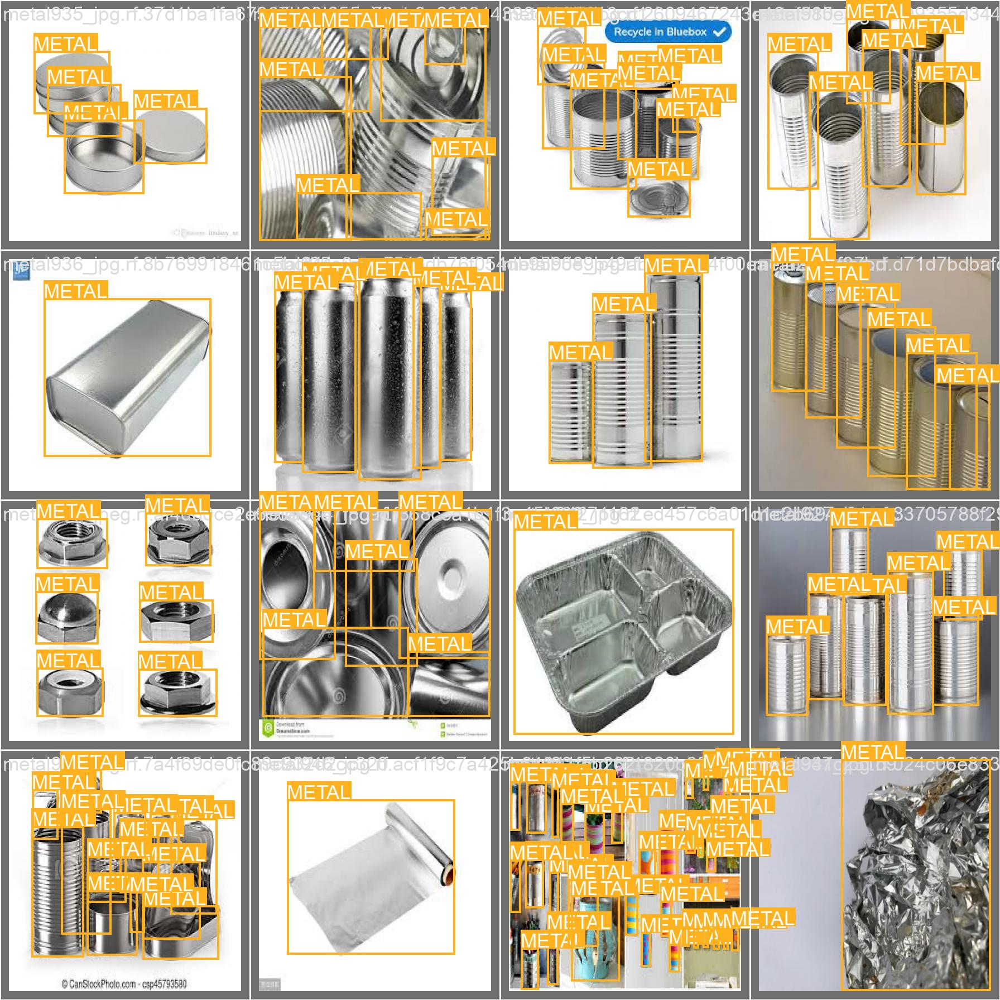

In [20]:
print("Ground Truth Training data :")
Image(filename= "/content/yolov5/runs/train/yolov5s_results/val_batch0_labels.jpg", width=900)

Ground Truth Augmented Training data :


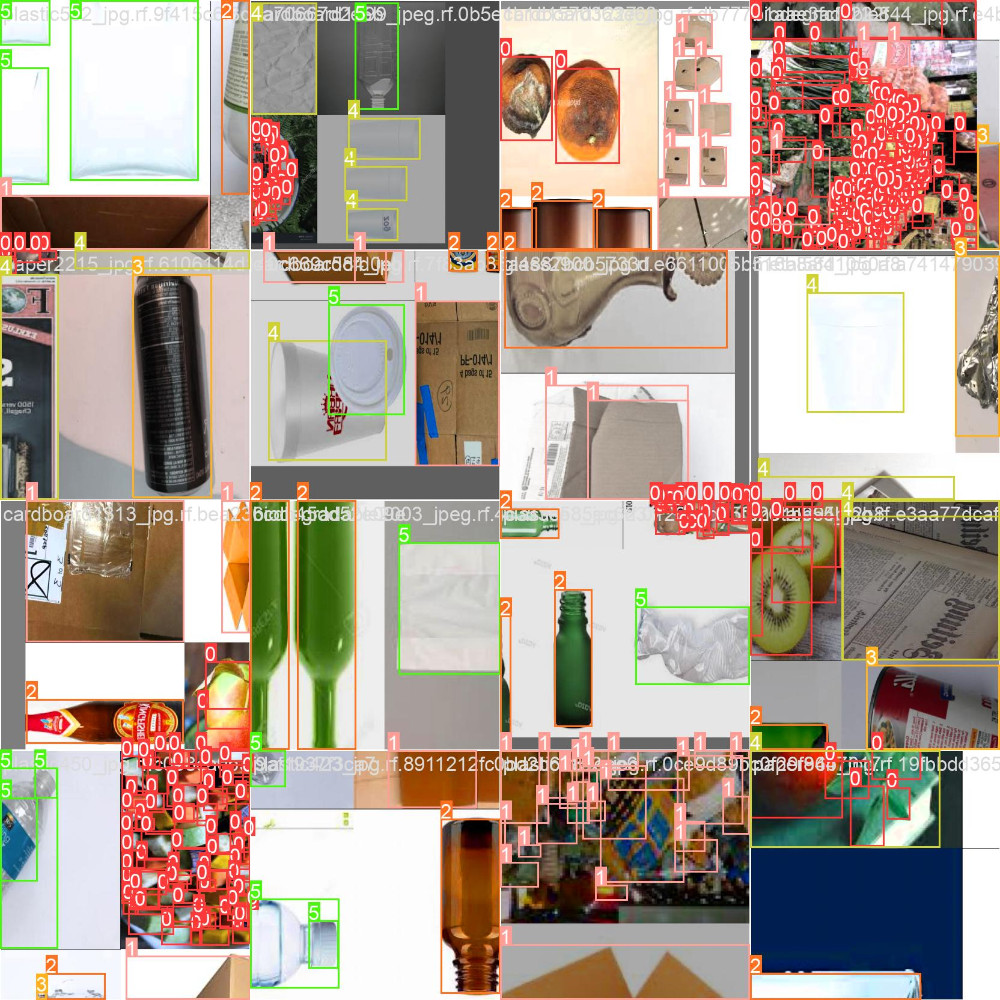

In [21]:
print("Ground Truth Augmented Training data :")
Image(filename= "/content/yolov5/runs/train/yolov5s_results/train_batch0.jpg", width=900)

In [22]:
# trained weights are saved by default in our weight folder
%ls runs/

train/


Run Inference With Trained Weights

In [23]:
%ls runs/train/yolov5s_results/weights

best.pt  last.pt


In [27]:
# when we ran this , we saw .007 second inference time. This is 140 FPS on a TESLA p100
# USE THE best weights
%cd /content/yolov5
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.4 --source "/content/GARBAGE CLASSIFICATION/valid/images"


/content/yolov5
detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=/content/GARBAGE CLASSIFICATION/valid/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-430-g459d8bf0 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7026307 parameters, 0 gradients, 15.8 GFLOPs
image 1/2098 /content/GARBAGE CLASSIFICATION/valid/images/biodegradable1000_jpg.rf.9407ff66b4ccd9f8eb5545be8f3225f4.jpg: 416x416 14 BIODEGRADABLEs, 7.2ms
image 2/2098 /content/GARBAGE CLASSIFICATION/valid/images/biodegradable1004_jpg.rf.645d319975e53c26

Export Trained Weights for Future Inference

In [33]:
from google.colab import files
files.download('/content/yolov5/runs/train/yolov5s_results/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [31]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [32]:
%cp /content/yolov5/runs/train/yolov5s_results/weights/best.pt /content/drive/MyDrive/Research/SignLanguageDetection/


cp: failed to access '/content/drive/MyDrive/Research/SignLanguageDetection/': Transport endpoint is not connected
